# Multimodal Prompt Engineering with Google Gemini

## Overview

Gemini 2.5 Flash is a new language model from the Gemini family. This model introduces a breakthrough long context window of up to 1 million tokens that can help seamlessly analyze large amounts of information and long-context understanding. It can process text, images, audio, video, and code all together for deeper insights. Learn more about [Gemini 2.5](https://deepmind.google/technologies/gemini/flash/).

Here we will:

- analyze images for insights.
- analyze audio for insights.
- understand videos (including their audio components).
- extract information from PDF documents.
- process images, video, audio, and text simultaneously.

## Getting Started

### Install Google Gen AI library for Python


In [ ]:
!pip install google-generativeai==0.8.3

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 160.8/160.8 kB 3.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 760.0/760.0 kB 16.2 MB/s eta 0:00:00
  Attempting uninstall: google-ai-generativelanguage
    Found existing installation: google-ai-generativelanguage 0.6.15
    Uninstalling google-ai-generativelanguage-0.6.15:
      Successfully uninstalled google-ai-generativelanguage-0.6.15
  Attempting uninstall: google-generativeai
    Found existing installation: google-generativeai 0.8.5
    Uninstalling google-generativeai-0.8.5:
      Successfully uninstalled google-generativeai-0.8.5


## Enter API Tokens

In [ ]:
from getpass import getpass

GOOGLE_API_KEY = getpass('Enter Gemini API Key:')

Enter Gemini API Key:··········


### Import libraries


In [6]:
import google.generativeai as genai

genai.configure(api_key=GOOGLE_API_KEY)

for m in genai.list_models():
  if 'generateContent' in m.supported_generation_methods:
    print(m.name)

models/gemini-2.5-pro-preview-03-25
models/gemini-2.5-flash
models/gemini-2.5-pro-preview-05-06
models/gemini-2.5-pro-preview-06-05
models/gemini-2.5-pro
models/gemini-2.0-flash-exp
models/gemini-2.0-flash
models/gemini-2.0-flash-001
models/gemini-2.0-flash-exp-image-generation
models/gemini-2.0-flash-lite-001
models/gemini-2.0-flash-lite
models/gemini-2.0-flash-lite-preview-02-05
models/gemini-2.0-flash-lite-preview
models/gemini-2.0-pro-exp
models/gemini-2.0-pro-exp-02-05
models/gemini-exp-1206
models/gemini-2.0-flash-thinking-exp-01-21
models/gemini-2.0-flash-thinking-exp
models/gemini-2.0-flash-thinking-exp-1219
models/gemini-2.5-flash-preview-tts
models/gemini-2.5-pro-preview-tts
models/learnlm-2.0-flash-experimental
models/gemma-3-1b-it
models/gemma-3-4b-it
models/gemma-3-12b-it
models/gemma-3-27b-it
models/gemma-3n-e4b-it
models/gemma-3n-e2b-it
models/gemini-flash-latest
models/gemini-flash-lite-latest
models/gemini-pro-latest
models/gemini-2.5-flash-lite
models/gemini-2.5-flash

### Load the Gemini 2.5 Flash model



In [5]:
generation_config = genai.types.GenerationConfig(
    temperature=0
)
gemini = genai.GenerativeModel(model_name='gemini-2.5-flash',
                               generation_config=generation_config)

### LLM basic usage

Below is a simple example that demonstrates how to prompt the Gemini 1.5 Flash model using the API. Learn more about the [Gemini API parameters](https://cloud.google.com/vertex-ai/generative-ai/docs/model-reference/gemini#gemini-pro).

In [8]:
from IPython.display import Markdown, display

prompt = """
  Explain what is Generative AI in 3 bullet points
"""

response = gemini.generate_content(contents=prompt)
display(Markdown(response.text))

Here are 3 bullet points explaining Generative AI:

*   **Creates New Content:** Generative AI is a type of artificial intelligence that *creates new, original content* (like text, images, audio, or code) rather than just analyzing or classifying existing data.
*   **Learns from Data Patterns:** It learns patterns, structures, and styles from vast amounts of existing data during its training phase, allowing it to understand how different elements combine.
*   **Generates Realistic & Novel Outputs:** Using what it has learned, it can then generate diverse outputs that are often indistinguishable from human-created content, or even produce entirely novel concepts.

## Image Analysis

In [9]:
# download images using curl
!curl https://i.imgur.com/6b9jwkk.png -o image1.png
!curl https://i.imgur.com/9CWuU2q.png -o image2.png

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  341k  100  341k    0     0  1365k      0 --:--:-- --:--:-- --:--:-- 1366k
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  347k  100  347k    0     0  1563k      0 --:--:-- --:--:-- --:--:-- 1570k


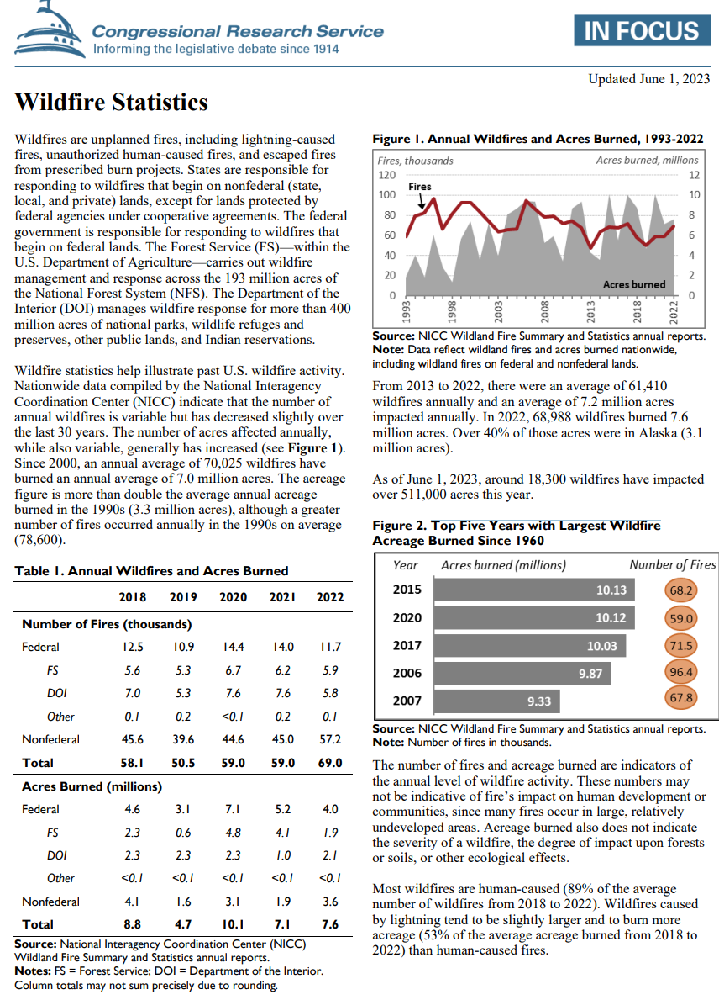

In [10]:
from IPython.display import Image as ImageDisp, display

display(ImageDisp('image1.png'))

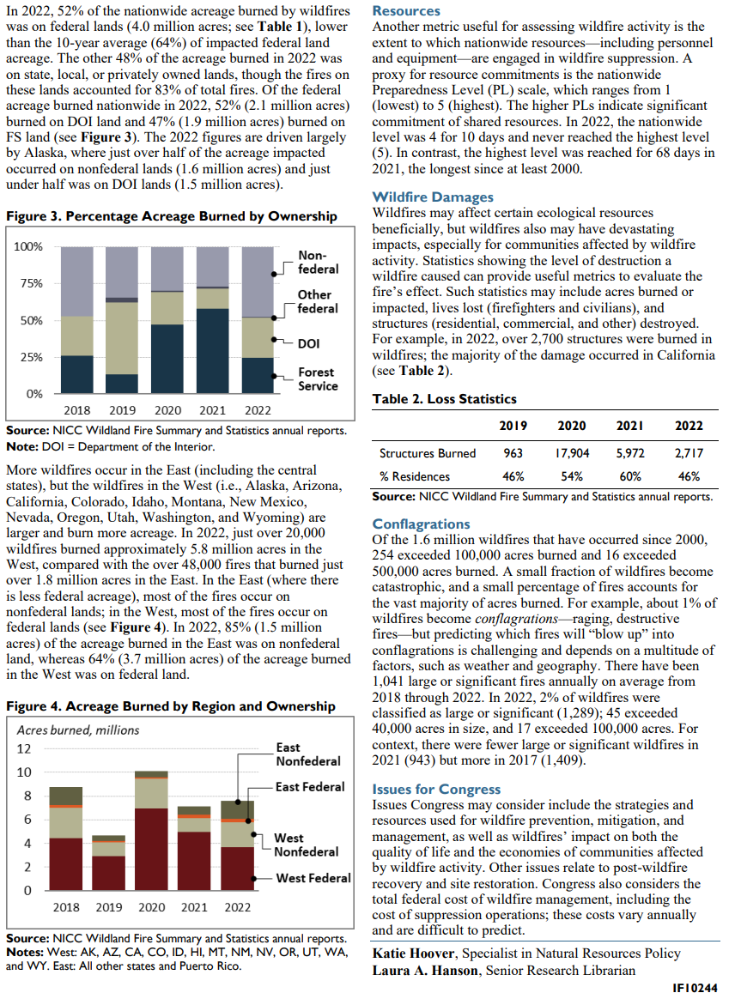

In [11]:
display(ImageDisp('image2.png'))

In [13]:
from PIL import Image

image1 = Image.open('image1.png')
image2 = Image.open('image2.png')

In [14]:
prompt = """
  Given the following images which can contain graphs, tables and text,
  analyze all of them to answer the following question:

  Tell me about the top 5 years with largest Wildfires
"""

contents = [image1, image2,  prompt]
response = gemini.generate_content(contents)
display(Markdown(response.text))

Based on Figure 2, "Top Five Years with Largest Wildfire Acreage Burned Since 1960," the top 5 years with the largest wildfire acreage burned are:

1.  **2015:** 10.13 million acres
2.  **2020:** 10.12 million acres
3.  **2017:** 10.03 million acres
4.  **2006:** 9.87 million acres
5.  **2007:** 9.33 million acres

In [15]:
prompt = """
  Given the following images which can contain graphs, tables and text,
  analyze all of them to answer the following question:

  Tell me about trend of wildfires in terms of acreage burned by region and ownership
"""

contents = [image1, image2,  prompt]
response = gemini.generate_content(contents)
display(Markdown(response.text))

Based on the provided images and text, here's an analysis of the trend of wildfires in terms of acreage burned by region and ownership from 2018 to 2022:

**Overall Acreage Trend (2018-2022):**
The total acreage burned by wildfires has fluctuated annually. According to Table 1, total acres burned (in millions) were:
*   **2018:** 8.8
*   **2019:** 4.7
*   **2020:** 10.1 (highest in this period)
*   **2021:** 7.1
*   **2022:** 7.6

**Ownership Trends:**

1.  **Federal Lands:**
    *   Federal lands consistently account for the **majority** of acreage burned.
    *   In 2022, 52% (4.0 million acres) of the total burned acreage was on federal lands (Table 1, Figure 3, and text).
    *   This percentage was even higher in previous years, peaking around 70% in 2020 (Figure 3).
    *   Within federal lands, the Department of the Interior (DOI) and Forest Service (FS) lands contribute significantly. In 2022, 52% (2.1 million acres) burned on DOI lands and 47% (1.9 million acres) burned on FS land (text).

2.  **Nonfederal Lands:**
    *   Nonfederal lands (state, local, or privately owned) account for the remaining acreage.
    *   Their share of total burned acreage increased to 48% (3.6 million acres) in 2022, up from around 30% in 2020 (Table 1, Figure 3).

**Regional Trends (West vs. East):**

1.  **Western United States:**
    *   The Western U.S. consistently accounts for the **vast majority** of acreage burned.
    *   In 2022, approximately 5.8 million acres burned in the West, compared to 1.8 million acres in the East (text).
    *   **West Federal:** This category consistently accounts for the largest share of burned acreage. Figure 4 shows it peaking around 6-7 million acres in 2020 and around 4 million acres in 2018. In 2022, 64% (3.7 million acres) of the acreage burned in the West was on federal land (text).
    *   **West Nonfederal:** Also contributes significantly, though generally less than West Federal. Figure 4 shows highs around 3-4 million acres in 2018 and 2-3 million acres in 2020.

2.  **Eastern United States:**
    *   While the East experiences more wildfires in terms of *number*, these fires burn significantly less acreage overall (text).
    *   **East Nonfederal:** The majority of the limited acreage burned in the East occurs on nonfederal lands. In 2022, 83% (1.5 million acres) of the acreage burned in the East was on nonfederal land (text).
    *   **East Federal:** Consistently accounts for the smallest amount of burned acreage, typically well under 0.5 million acres annually (Figure 4).

**Summary of Trends:**

*   Wildfire acreage burned fluctuates year-to-year, with 2020 being a high year in the 2018-2022 period.
*   The overwhelming majority of acreage burned occurs in the **Western United States**, primarily on **federal lands**.
*   In the **Eastern United States**, while fires are numerous, they burn significantly less acreage, and the majority of that acreage is on **nonfederal lands**.
*   The proportion of acreage burned on nonfederal lands increased in 2022 compared to previous years, particularly influenced by events in Alaska (text).

## PDF Doc Analysis

In [16]:
!wget https://arxiv.org/pdf/1706.03762.pdf

--2025-12-02 18:19:04--  https://arxiv.org/pdf/1706.03762.pdf
Resolving arxiv.org (arxiv.org)... 151.101.3.42, 151.101.195.42, 151.101.131.42, ...
Connecting to arxiv.org (arxiv.org)|151.101.3.42|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: /pdf/1706.03762 [following]
--2025-12-02 18:19:04--  https://arxiv.org/pdf/1706.03762
Reusing existing connection to arxiv.org:443.
HTTP request sent, awaiting response... 200 OK
Length: 2215244 (2.1M) [application/pdf]
Saving to: ‘1706.03762.pdf’

1706.03762.pdf      100%[===================>]   2.11M  --.-KB/s    in 0.03s   

2025-12-02 18:19:04 (76.7 MB/s) - ‘1706.03762.pdf’ saved [2215244/2215244]



In [17]:
pdf_ref = genai.upload_file(path='./1706.03762.pdf')
pdf_ref

genai.File({
    'name': 'files/0f6oyrknvwuk',
    'display_name': '1706.03762.pdf',
    'mime_type': 'application/pdf',
    'sha256_hash': 'YmRmYWE2OGQ4OTg0ZjBkYzAyYmVhY2E1MjdiNzZmMjA3ZDk5YjY2NmQzMWQxZGE3MjhlZTA3MjgxODJkZjY5Nw==',
    'size_bytes': '2215244',
    'state': 'ACTIVE',
    'uri': 'https://generativelanguage.googleapis.com/v1beta/files/0f6oyrknvwuk',
    'create_time': '2025-12-02T18:19:06.498363Z',
    'expiration_time': '2025-12-04T18:19:05.745858908Z',
    'update_time': '2025-12-02T18:19:06.498363Z'})

In [18]:
prompt = """
  Given the PDF file, use it to answer the following question:

  Tell me about the research paper mentioned here
"""

contents = [pdf_ref, prompt]

response = gemini.generate_content(contents)

Markdown(response.text)

The research paper mentioned here is titled "**Attention Is All You Need**," published at the 31st Conference on Neural Information Processing Systems (NIPS) in 2017. It is a highly influential and foundational paper in the field of natural language processing (NLP) and machine learning.

Here's a summary of the research paper:

1.  **Core Contribution:** The paper introduces a novel network architecture called the **Transformer**. Its most significant innovation is that it **relies solely on attention mechanisms**, completely dispensing with recurrent neural networks (RNNs) and convolutional neural networks (CNNs) that were dominant in sequence transduction models at the time.

2.  **Motivation:**
    *   Existing sequence transduction models (like those for machine translation) were primarily based on complex RNNs or CNNs.
    *   RNNs, in particular, suffer from inherent sequential computation, which limits parallelization and makes training slow, especially for very long sequences.
    *   While attention mechanisms were already used to connect encoders and decoders, they were typically used *in conjunction* with recurrent networks.

3.  **Key Architectural Features:**
    *   **Encoder-Decoder Structure:** The Transformer maintains the standard encoder-decoder architecture.
    *   **Multi-Head Self-Attention:** This is the core building block. It allows the model to weigh the importance of different parts of the input sequence when processing each element, and to do so in parallel across multiple "attention heads" that can learn different types of relationships.
    *   **Positional Encoding:** Since there are no RNNs or CNNs to inherently capture sequence order, the Transformer injects information about the relative or absolute position of tokens using sinusoidal positional encodings.
    *   **Feed-Forward Networks:** Each layer also includes a position-wise fully connected feed-forward network.
    *   **Residual Connections and Layer Normalization:** Used throughout the architecture to facilitate training of deep networks.

4.  **Main Advantages & Results:**
    The Transformer demonstrated significant improvements over previous state-of-the-art models:
    *   **Superior Quality:** Achieved new state-of-the-art BLEU scores on major machine translation tasks:
        *   **WMT 2014 English-to-German:** 28.4 BLEU, outperforming existing best results (including ensembles) by over 2 BLEU.
        *   **WMT 2014 English-to-French:** 41.8 BLEU, establishing a new single-model state-of-the-art.
    *   **Faster Training & Parallelization:** Due to its attention-only design, the Transformer is significantly more parallelizable than RNNs, leading to much faster training times (e.g., 3.5 days on eight P100 GPUs for the "big" model, a small fraction of the training costs of the best models from the literature).
    *   **Better Long-Range Dependency Capture:** Self-attention connects all positions with a constant number of sequential operations, making it easier to learn long-range dependencies compared to RNNs (which require O(n) sequential operations) or CNNs (which might require O(logk(n)) or O(n/k) operations).
    *   **Generalizability:** The model successfully generalized to other tasks, such as English constituency parsing, performing surprisingly well even with limited task-specific tuning.
    *   **Interpretability:** The authors also noted that individual attention heads often learn to perform different tasks and exhibit behavior related to the syntactic and semantic structure of sentences.

5.  **Impact:**
    "Attention Is All You Need" is a landmark paper because the Transformer architecture it introduced has become the foundational model for most modern large language models (LLMs) and many other state-of-the-art NLP systems, including BERT, GPT, T5, and more. Its emphasis on attention and parallelization revolutionized how sequence data is processed.

The authors also made their code available through TensorFlow/tensor2tensor, contributing to its widespread adoption and further research.

## Audio understanding

Gemini 1.5 Flash can directly process audio for long-context understanding.


In [19]:
!wget "https://storage.googleapis.com/cloud-samples-data/generative-ai/audio/pixel.mp3"

--2025-12-02 18:19:33--  https://storage.googleapis.com/cloud-samples-data/generative-ai/audio/pixel.mp3
Resolving storage.googleapis.com (storage.googleapis.com)... 192.178.213.207, 142.250.153.207, 142.250.145.207, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|192.178.213.207|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 5030643 (4.8M) [audio/mpeg]
Saving to: ‘pixel.mp3’

pixel.mp3           100%[===================>]   4.80M  5.91MB/s    in 0.8s    

2025-12-02 18:19:34 (5.91 MB/s) - ‘pixel.mp3’ saved [5030643/5030643]



In [20]:
import IPython

IPython.display.Audio('./pixel.mp3')

In [21]:
audio_file = genai.upload_file(path='./pixel.mp3')

In [22]:
audio_file

genai.File({
    'name': 'files/cw9cpnlesotf',
    'display_name': 'pixel.mp3',
    'mime_type': 'audio/mpeg',
    'sha256_hash': 'M2E4NTUyMmUwOGU1NGRiOWJhMjNmODVjNTk2M2Q5ZTk0ODUyMGY0YWVhOGYxNmY2ZGQ2NWYyMzg0Zjk3Y2IwZg==',
    'size_bytes': '5030643',
    'state': 'ACTIVE',
    'uri': 'https://generativelanguage.googleapis.com/v1beta/files/cw9cpnlesotf',
    'create_time': '2025-12-02T18:19:36.291140Z',
    'expiration_time': '2025-12-04T18:19:35.450444825Z',
    'update_time': '2025-12-02T18:19:36.291140Z'})

#### Example 1: Title Generation

In [23]:
prompt = """
  Please provide a summary for the audio.
  Provide chapter titles with timestamps, be concise and short, no need to provide chapter summaries.
  Do not make up any information that is not part of the audio and do not be verbose.
"""

contents = [audio_file, prompt]
response = gemini.generate_content(contents=contents)
print(response.text)

This episode of the Made by Google Podcast features Aisha Sharif and DeCarlos Love, product managers for Pixel devices, discussing the significance and details of Pixel feature drops. They highlight how these drops continuously improve Google's entire device portfolio, from phones and watches to tablets. The conversation covers personal favorite features like recorder transcription and heart rate tracking, as well as specific updates from the January and March feature drops. Key new functionalities include Circle to Search, body temperature sensing, photo emoji, pace features, activity recognition, 10-bit HDR in Instagram, partial screen sharing, and Docs Markup. They emphasize the crucial role of user feedback in shaping these updates and confirm the March feature drop's rollout.

Here are the chapter titles with timestamps:

- **0:00 - Introduction to Pixel Feature Drops**
- **0:35 - Aisha's Most Transformative Feature**
- **0:57 - DeCarlos's Most Transformative Feature**
- **1:43 - 

#### Example 2: Transcription

In [24]:
prompt = """
    Can you transcribe this interview, in the format of [timecode] - [speaker] : caption.
    Use speaker A, speaker B, etc. to identify the speakers. Map each speaker to their real name at the start of the output
    Each speaker should have a single caption based on their starting timestamp
    Do not break up the transcript into multiple timestamps for the same speaker
    Show the output only for the part of the conversation about the pixel watch and follow the format mentioned above for the output
"""

contents = [audio_file, prompt]
response = gemini.generate_content(contents=contents)
print(response.text)

Here's the transcription of the conversation about the Pixel Watch:

0:57 - Rashid Finch: Amazing. DeCarlos, same question to you, but for Pixel Watch, of course, long-time listeners will know you work on Pixel Watch. What has been the most transformative feature in your own life on Pixel Watch?
1:07 - DeCarlos Love: I work on the fitness experiences and so for me it's definitely the ability to track my heart rate, but specifically around the different heart rate targets and zone features that we've released. For me it's been super helpful. My background is in more football, track and field and in terms of what I've done before and so using the heart rate features to really help me understand that I shouldn't be going as hard when I'm running, you know, leisurely two or three miles and helping me really tone that down a bit. It's actually been pretty transformative for me to see how things like my resting heart rate have changed due to that feature.
1:49 - Aisha Sharif: So, exactly wha

#### Example 3: Summarization

In [25]:
prompt = """
    Given the audio file, generate a comprehensive summary of:
     - Key Speakers
     - Key products and features discussed
     - Any other noteworthy discussions
"""

contents = [audio_file, prompt]
response = gemini.generate_content(contents=contents)
display(Markdown(response.text))

This episode of the "Made by Google Podcast," hosted by Rashid Finch, features Aisha Sharif and DeCarlos Love, both Product Managers for various Pixel devices. The discussion centers around Pixel Feature Drops, their significance, and the latest March 2024 release.

**Key Speakers:**
*   **Rashid Finch:** Host
*   **Aisha Sharif:** Product Manager, Pixel devices
*   **DeCarlos Love:** Product Manager, Pixel devices

**Key Products and Features Discussed:**

**Overarching Theme/Narrative:**
*   The core philosophy behind feature drops is that Pixel devices are continuously getting better over time.
*   Feature drops tell a "joint narrative" across the entire Google Pixel portfolio, including phones, watches, buds, tablets, and even Chrome OS.
*   A significant announcement for Pixel 8 and Pixel 8 Pro is the commitment to **seven years of OS updates, security updates, and feature drops**, emphasizing longevity.

**January Feature Drop Highlights (discussed by Aisha):**
*   This was one of the few times a software drop was paired with a hardware release.
*   **New Mint Color:** Introduced for Pixel 8 and Pixel 8 Pro.
*   **Body Temperature Sensor:** Launched in the US for Pixel 8 and Pixel 8 Pro, allowing users to scan their forehead for temperature readings.
*   **AI Enhancements:**
    *   **Circle to Search:** Came to Pixel 8 and Pixel 8 Pro, enabling users to search from anywhere on their screen.
    *   **Photo Emoji:** Allows users to use photos from their album to react to messages (Aisha shared a fun anecdote about using a donut ice cream sandwich photo).

**March Feature Drop Highlights (rolling out March 4th):**

*   **For Pixel Watch (discussed by DeCarlos):**
    *   Focus on bringing features to **previous generation watches** (Pixel Watch 1 receiving features from Pixel Watch 2).
    *   **Pace Features:** For workouts, allowing users to set a target pace and receive notifications if they are ahead or behind.
    *   **Heart Rate Zones:** Similar to pace features, helping users stay within specific heart rate targets during workouts.
    *   **Activity Recognition (for Pixel Watch 1):** Automatically starts and stops workouts, and includes auto-pause functionality.
    *   **Fitbit Relax App (for Pixel Watch 1):** Brings guided breathing exercises to the wrist, previously available on Pixel Watch 2.

*   **For Pixel Phones (discussed by Aisha):**
    *   Echoes the "devices made to last" sentiment by expanding features to older models.
    *   **Circle to Search:** Expanding to Pixel 7 and Pixel 7 Pro.
    *   **10-bit HDR:** Moving beyond just the camera app, it will now be available in Instagram for creating high-quality reels.
    *   **Partial Screen Sharing:** Allows users to share only a specific app instead of their entire phone screen, enhancing privacy during meetings or casting.

*   **For the Rest of the Portfolio (discussed by Aisha):**
    *   **App Screen Sharing:** Coming to Pixel Tablet.
    *   **Docs Markup:** Coming to Pixel Tablet (and also available on phones), allowing users to directly draw and take notes on documents.
    *   **Bluetooth Connection Improvements:** Enhanced seamless connection for previously paired devices (e.g., if buds were connected to a phone, they'll easily connect to a new tablet associated with the same account).

**Favorite Past Feature Drops (from the speakers):**

*   **Aisha's Favorites (Call Features):**
    *   **Call Screen Enhancements (December):** Introduced contextual chips for quick responses (e.g., for package deliveries).
    *   **Direct My Call:** Now available for non-toll-free numbers (e.g., doctor's offices with local area codes), acting as a significant time-saver.
    *   **Clear Calling:** Reduces background noise during calls, making conversations clearer.

*   **DeCarlos' Favorites:**
    *   **SpO2 (Oxygen Saturation) Feature:** Released in a previous drop, allowing the Pixel Watch to measure oxygen saturation overnight during sleep.
    *   **Relax App (current March drop):** He specifically loves the attention to detail in the design of the breathing animations, including the pace and haptics.

**Other Noteworthy Discussions:**

*   **The Importance of User Feedback:** A question from the Pixel Superfans community (Casey Carpenter) prompted a discussion on how Google decides which features to release.
    *   **DeCarlos** emphasized the core principle of continuous improvement and bringing features to older devices where possible. He noted that hardware limitations sometimes prevent features from being backported, but they always strive to do so, especially when user feedback indicates high value and helpfulness.
    *   **Aisha** reiterated that user feedback is "huge" and central to everything they do. Feature drops are a key mechanism to enhance existing features, add new improvements, and introduce entirely new functionalities based on what users are saying and valuing.

## Video with audio understanding

Try out Gemini 1.5 Flash’s native multimodal and long context capabilities on video interleaving with audio inputs.

In [26]:
!wget "https://storage.googleapis.com/cloud-samples-data/generative-ai/video/pixel8.mp4"

--2025-12-02 18:21:06--  https://storage.googleapis.com/cloud-samples-data/generative-ai/video/pixel8.mp4
Resolving storage.googleapis.com (storage.googleapis.com)... 74.125.128.207, 74.125.143.207, 173.194.69.207, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|74.125.128.207|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 4951975 (4.7M) [video/mp4]
Saving to: ‘pixel8.mp4’

pixel8.mp4          100%[===================>]   4.72M  6.42MB/s    in 0.7s    

2025-12-02 18:21:07 (6.42 MB/s) - ‘pixel8.mp4’ saved [4951975/4951975]



In [27]:
IPython.display.Video('pixel8.mp4', embed=True, width=450)

In [28]:
video_file = genai.upload_file(path='./pixel8.mp4')

In [29]:
prompt = """
  Provide a comprehensive summary of the video.
  The summary should also contain anything important which people discuss in the video.
"""

contents = [video_file, prompt]

response = gemini.generate_content(contents=contents)
display(Markdown(response.text))

BadRequest: 400 POST https://generativelanguage.googleapis.com/v1beta/models/gemini-2.5-flash:generateContent?%24alt=json%3Benum-encoding%3Dint: The File geetkxxi2coj is not in an ACTIVE state and usage is not allowed.

In [ ]:
!gdown -O 'awsq_video.mp4' '1shnBXeuXYcbRr9IhxofHkT3rlSaqPG1e'

In [ ]:
IPython.display.Video('awsq_video.mp4', embed=True, width=450)

In [ ]:
vid = genai.upload_file(path='./awsq_video.mp4')

In [ ]:
prompt = """
  Provide a description of the video.
  The description should cover the key steps covered in the video in bullet points
"""

contents = [vid, prompt]
response = gemini.generate_content(contents)
display(Markdown(response.text))

Gemini 1.5 Pro model is able to process the video with audio, retrieve and extract textual and audio information.

## All modalities (images, video, audio, text) at once

Gemini 1.5 Pro is natively multimodal and supports interleaving of data from different modalities, it can support a mix of audio, visual, text, and
code inputs in the same input sequence.

In [ ]:
!wget 'https://storage.googleapis.com/cloud-samples-data/generative-ai/video/behind_the_scenes_pixel.mp4'

In [ ]:
!wget 'https://storage.googleapis.com/cloud-samples-data/generative-ai/image/a-man-and-a-dog.png'

In [ ]:
IPython.display.Image('a-man-and-a-dog.png', width=450)

In [ ]:
video_file = genai.upload_file(path='./behind_the_scenes_pixel.mp4')
image_file = genai.upload_file(path='./a-man-and-a-dog.png')

In [ ]:
prompt = """
  Look through each frame in the video carefully and answer the questions.
  Only base your answers strictly on what information is available in the video attached.
  Do not make up any information that is not part of the video and summarize your answer
  in three bullet points max

  Questions:
  - When is the moment in the image happening in the video? Provide a timestamp.
  - What is the context of the moment and what does the narrator say about it?
"""

contents = [video_file, image_file, prompt]
response = gemini.generate_content(contents)
display(Markdown(response.text))

## Conclusion

In this tutorial, you've learned how to use the Gemini 1.5 Flash to:

- analyze images for insights.
- analyze PDF docs for insights.
- analyze audio for insights.
- understand videos (including their audio components).
- process images, video, audio, and text simultaneously.